### B5. LANDSAT 8 - calculate NDWI_ICE and extract water feature

#### 0. Load required libraries,  area dependant constants and utility functions:

In [1]:
from os import listdir
from os.path import isfile, join
import numpy as np
import seaborn as sns

# EOLearn libraries:
from eolearn.core import EOTask, EOPatch, LinearWorkflow, LoadTask, SaveTask, FeatureType, EOExecutor
from eolearn.core import OverwritePermission

# Add to python path parent dictionary
import sys
sys.path.append("../../")

# load site dependant constants (HERE YOU CAN CHOOSE DIFFERENT LOCATION)
from aoi_sites import upe_promice_area as site

# load utility functions
from utils import io_functions as io_utils
from utils import plot_functions as plot_utils

### 1. Set up EOTasks for MODIS to calculate B/R ratio and EuclideanNorm

In [2]:
class NormalizedDifferenceIndex(EOTask):   
    """
    The tasks calculates user defined Normalised Difference Index (NDI) between two bands B and R as:
    Normalized B/R = (B-R)/(B+R)
    """
    def __init__(self, feature_name, band_a, band_b):
        self.feature_name = feature_name
        self.band_a_fetaure_name = band_a.split('/')[0]
        self.band_b_fetaure_name = band_b.split('/')[0]
        self.band_a_fetaure_idx = int(band_a.split('/')[-1])
        self.band_b_fetaure_idx = int(band_b.split('/')[-1])
        
    def execute(self, eopatch):
        band_a = eopatch.data[self.band_a_fetaure_name][..., self.band_a_fetaure_idx]
        band_b = eopatch.data[self.band_b_fetaure_name][..., self.band_b_fetaure_idx]
        
        ndi = (band_a - band_b) / (band_a  + band_b)
        
        eopatch.add_feature(FeatureType.DATA, self.feature_name, ndi[..., np.newaxis])
        
        return eopatch
    
class EuclideanNorm(EOTask):   
    """
    The tasks calculates Euclidian Norm of all bands within an array:
    norm = sqrt(sum_i Bi**2),
    where Bi are the individual bands within user-specified feature array.
    """
    def __init__(self, feature_name, in_feature_name):
        self.feature_name = feature_name
        self.in_feature_name = in_feature_name
    
    def execute(self, eopatch):
        arr = eopatch.data[self.in_feature_name]
        norm = np.sqrt(np.sum(arr**2, axis=-1))
        
        eopatch.add_feature(FeatureType.DATA, self.feature_name, norm[..., np.newaxis])
        return eopatch

### 2. Set up and execute EOWorkflow

In [5]:
io_utils.get_eopatches_dir(site.DATA_PRODUCTS[1], site.SITE_NAME, site.AVAILABLE_CRSs[0], site.DATE_RANGES_LANDSAT_8[0])

'../../data/EOPatches/LANDSAT_8/UPE_PROMICE/UTM_22N/2013_05-2013_10/'

In [6]:
# creating eo task producing Normalized Red / Blue ratio and application of all eopatches
# BAND 2 - blue and BAND 4 - red
calculate_br_eotask = NormalizedDifferenceIndex('LANDSAT_NDWI_ICE', 'LANDSAT_RAW_BANDS/1', 'LANDSAT_RAW_BANDS/3') 
# creating eo task calculating EuclideanNorm of all raw bands of ea patches
calculate_enorm_eotask = EuclideanNorm('LANDSAT_EUC_NORM_RAW_BANDS', 'LANDSAT_RAW_BANDS') 

for date_range_landsat in site.DATE_RANGES_LANDSAT_8 :
    print('Reading EOPatches from:', date_range_landsat )
    eopatches_filepath = io_utils.get_eopatches_dir(site.DATA_PRODUCTS[1], site.SITE_NAME, site.AVAILABLE_CRSs[0], date_range_landsat)
    # TASK TO LOAD AND SAVE EXISTING EOPATCHES HAS TO BE CREATED YEARLY (different directories)
    load_eotask = LoadTask(eopatches_filepath)
    save_eotask = SaveTask(eopatches_filepath, overwrite_permission=OverwritePermission.OVERWRITE_PATCH, compress_level=1)
    
    # Define the workflow
    workflow = LinearWorkflow(
    load_eotask,
    calculate_br_eotask,
    calculate_enorm_eotask,
    save_eotask
    )
                      
    list_of_available_patches = io_utils.get_list_of_eopatches(eopatches_filepath)
    execution_args = []
    for eopatch_name in list_of_available_patches:
        execution_args.append({
        load_eotask: {'eopatch_folder': eopatch_name},
        save_eotask: {'eopatch_folder': eopatch_name}
        })
    
    #print(execution_args)                            
    executor = EOExecutor(workflow, execution_args, save_logs=True)
    executor.run(workers=1, multiprocess=False)

    executor.make_report()

Reading EOPatches from: ('2013-05-01', '2013-10-31')


C:\Users\Kamil\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide


C:\Users\Kamil\Anaconda3\lib\site-packages\jinja2\utils.py:485: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import MutableMapping
C:\Users\Kamil\Anaconda3\lib\site-packages\holoviews\core\data\grid.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import OrderedDict, defaultdict, Iterable
C:\Users\Kamil\Anaconda3\lib\site-packages\holoviews\operation\datashader.py:3: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Callable, Iterable
C:\Users\Kamil\Anaconda3\lib\site-packages\numba\npyufunc\dufunc.py:86: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargs

Reading EOPatches from: ('2014-05-01', '2014-10-31')


C:\Users\Kamil\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide



Reading EOPatches from: ('2015-05-01', '2015-10-31')



Reading EOPatches from: ('2016-05-01', '2016-10-31')



Reading EOPatches from: ('2017-05-01', '2017-10-31')



Reading EOPatches from: ('2018-05-01', '2018-10-31')



Reading EOPatches from: ('2019-05-01', '2019-10-31')


In [204]:
# checking exemplary data:
exemplary_eopatch = EOPatch.load('../../data/EOPatches/LANDSAT_8/UPE_PROMICE/UTM_22N/2019_05-2019_10/3176_maxcc_0.05_x-5_y-134')

2019-07-01 00:01:00


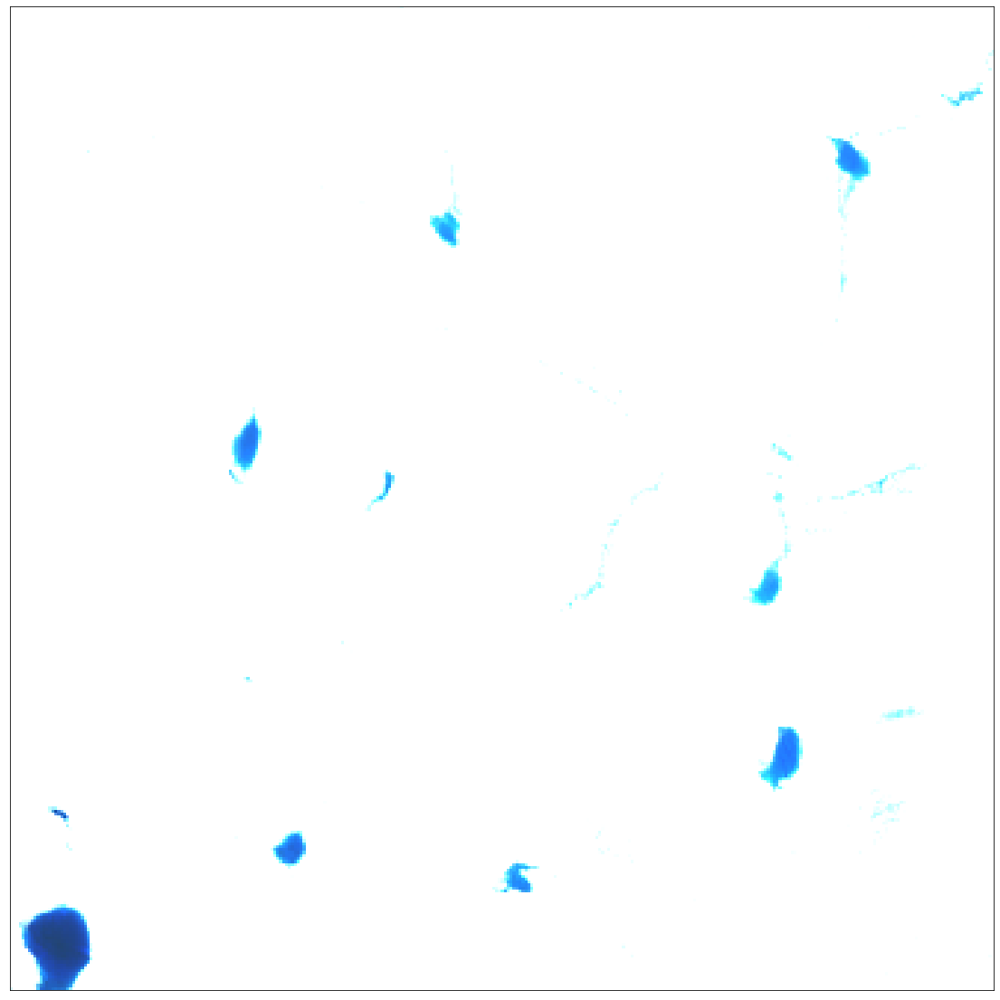

In [205]:
#exemplary_eopatch = EOPatch.load('../../data/EOPatches/LANDSAT_8/UPE_PROMICE/UTM_22N/2019_05-2019_10/2969_maxcc_0.05_x-3_y-130')
plot_utils.plot_RGB_LANDSAT_8_image(exemplary_eopatch, datetime_idx=10)

In [187]:
exemplary_eopatch

EOPatch(
  data: {
    LANDSAT_EUC_NORM_RAW_BANDS: numpy.ndarray(shape=(23, 333, 333, 1), dtype=float32)
    LANDSAT_NDWI: numpy.ndarray(shape=(23, 333, 333, 1), dtype=float32)
    LANDSAT_NDWI_GREEN_NIR: numpy.ndarray(shape=(23, 333, 333, 1), dtype=float32)
    LANDSAT_NDWI_ICE: numpy.ndarray(shape=(23, 333, 333, 1), dtype=float32)
    LANDSAT_NDWI_NIR_SWIR_1: numpy.ndarray(shape=(23, 333, 333, 1), dtype=float32)
    LANDSAT_NDWI_NIR_SWIR_2: numpy.ndarray(shape=(23, 333, 333, 1), dtype=float32)
    LANDSAT_QA_LAYERS: numpy.ndarray(shape=(23, 333, 333, 5), dtype=float32)
    LANDSAT_RAW_BANDS: numpy.ndarray(shape=(23, 333, 333, 11), dtype=float32)
    MODIS_EUC_NORM_RAW_BANDS: numpy.ndarray(shape=(23, 333, 333, 1), dtype=float32)
    MODIS_NDWI: numpy.ndarray(shape=(23, 333, 333, 1), dtype=float32)
    MODIS_NRB: numpy.ndarray(shape=(23, 333, 333, 1), dtype=float32)
    MODIS_RAW_BANDS_DAY_0: numpy.ndarray(shape=(23, 333, 333, 7), dtype=float32)
    MODIS_RAW_BANDS_DAY_AFTER: numpy.nda

### 3. Check distribution of the pictures

In [218]:
import seaborn as sns
results = exemplary_eopatch.data['LANDSAT_NDWI'][10]
print(np.std(results[..., [0]].reshape(1* 333* 333)))
print(np.var(results[..., [0]].reshape(1* 333* 333)))
sns.distplot(results[..., [0]].reshape(1* 333* 333))

IndexError: index 10 is out of bounds for axis 0 with size 7

### 4. Produce water mask task and check quality (several threshold values <= 0.25)

In [47]:
class NormalizedDifferenceIndex(EOTask):   
    """
    The tasks calculates user defined Normalised Difference Index (NDI) between two bands B and R as:
    Normalized B/R = (B-R)/(B+R)
    """
    def __init__(self, feature_name, band_a, band_b):
        self.feature_name = feature_name
        self.band_a_fetaure_name = band_a.split('/')[0]
        self.band_b_fetaure_name = band_b.split('/')[0]
        self.band_a_fetaure_idx = int(band_a.split('/')[-1])
        self.band_b_fetaure_idx = int(band_b.split('/')[-1])
        
    def execute(self, eopatch):
        band_a = eopatch.data[self.band_a_fetaure_name][..., self.band_a_fetaure_idx]
        band_b = eopatch.data[self.band_b_fetaure_name][..., self.band_b_fetaure_idx]
        
        ndi = (band_a - band_b) / (band_a  + band_b)
        
        eopatch.add_feature(FeatureType.DATA, self.feature_name, ndi[..., np.newaxis])
        
        return eopatch

In [48]:
ndwi_eotask_green_nir = NormalizedDifferenceIndex('LANDSAT_NDWI_GREEN_NIR', 'LANDSAT_RAW_BANDS/2', 'LANDSAT_RAW_BANDS/4')
ndwi_eotask_nir_swir_1 = NormalizedDifferenceIndex('LANDSAT_NDWI_NIR_SWIR_1', 'LANDSAT_RAW_BANDS/4', 'LANDSAT_RAW_BANDS/5')
ndwi_eotask_nir_swir_2 = NormalizedDifferenceIndex('LANDSAT_NDWI_NIR_SWIR_2', 'LANDSAT_RAW_BANDS/4', 'LANDSAT_RAW_BANDS/6')

for date_range_landsat in site.DATE_RANGES_LANDSAT_8 :
    print('Reading EOPatches from:', date_range_landsat )
    eopatches_filepath = io_utils.get_eopatches_dir(site.DATA_PRODUCTS[1], site.SITE_NAME, site.AVAILABLE_CRSs[0], date_range_landsat)
    # TASK TO LOAD AND SAVE EXISTING EOPATCHES HAS TO BE CREATED YEARLY (different directories)
    load_eotask = LoadTask(eopatches_filepath)
    save_eotask = SaveTask(eopatches_filepath, overwrite_permission=OverwritePermission.OVERWRITE_PATCH, compress_level=1)
    
    # Define the workflow
    workflow = LinearWorkflow(
    load_eotask,
    ndwi_eotask_green_nir,
    ndwi_eotask_nir_swir_1,
    ndwi_eotask_nir_swir_2,
    save_eotask
    )
                      
    list_of_available_patches = io_utils.get_list_of_eopatches(eopatches_filepath)
    execution_args = []
    for eopatch_name in list_of_available_patches:
        execution_args.append({
        load_eotask: {'eopatch_folder': eopatch_name},
        save_eotask: {'eopatch_folder': eopatch_name}
        })
    
    #print(execution_args)                            
    executor = EOExecutor(workflow, execution_args, save_logs=True)
    executor.run(workers=1, multiprocess=False)

    executor.make_report()

Reading EOPatches from: ('2013-05-01', '2013-10-31')


C:\Users\Kamil\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide


C:\Users\Kamil\Anaconda3\lib\site-packages\jinja2\utils.py:485: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import MutableMapping
C:\Users\Kamil\Anaconda3\lib\site-packages\holoviews\core\data\grid.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import OrderedDict, defaultdict, Iterable
C:\Users\Kamil\Anaconda3\lib\site-packages\holoviews\operation\datashader.py:3: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Callable, Iterable
C:\Users\Kamil\Anaconda3\lib\site-packages\numba\npyufunc\dufunc.py:86: DeprecationWarning: inspect.getargspec() is deprecated since Python 3.0, use inspect.signature() or inspect.getfullargs

Reading EOPatches from: ('2014-05-01', '2014-10-31')


C:\Users\Kamil\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide



Reading EOPatches from: ('2015-05-01', '2015-10-31')



Reading EOPatches from: ('2016-05-01', '2016-10-31')



Reading EOPatches from: ('2017-05-01', '2017-10-31')



Reading EOPatches from: ('2018-05-01', '2018-10-31')



Reading EOPatches from: ('2019-05-01', '2019-10-31')


### 5. Compare different water masks

### a) horrible picture:

In [304]:
# checking exemplary data:
exemplary_eopatch = EOPatch.load('../../data/EOPatches/LANDSAT_8/UPE_PROMICE/UTM_22N/2013_05-2013_10/2969_maxcc_0.05_x-3_y-130')

2013-05-25 15:26:35


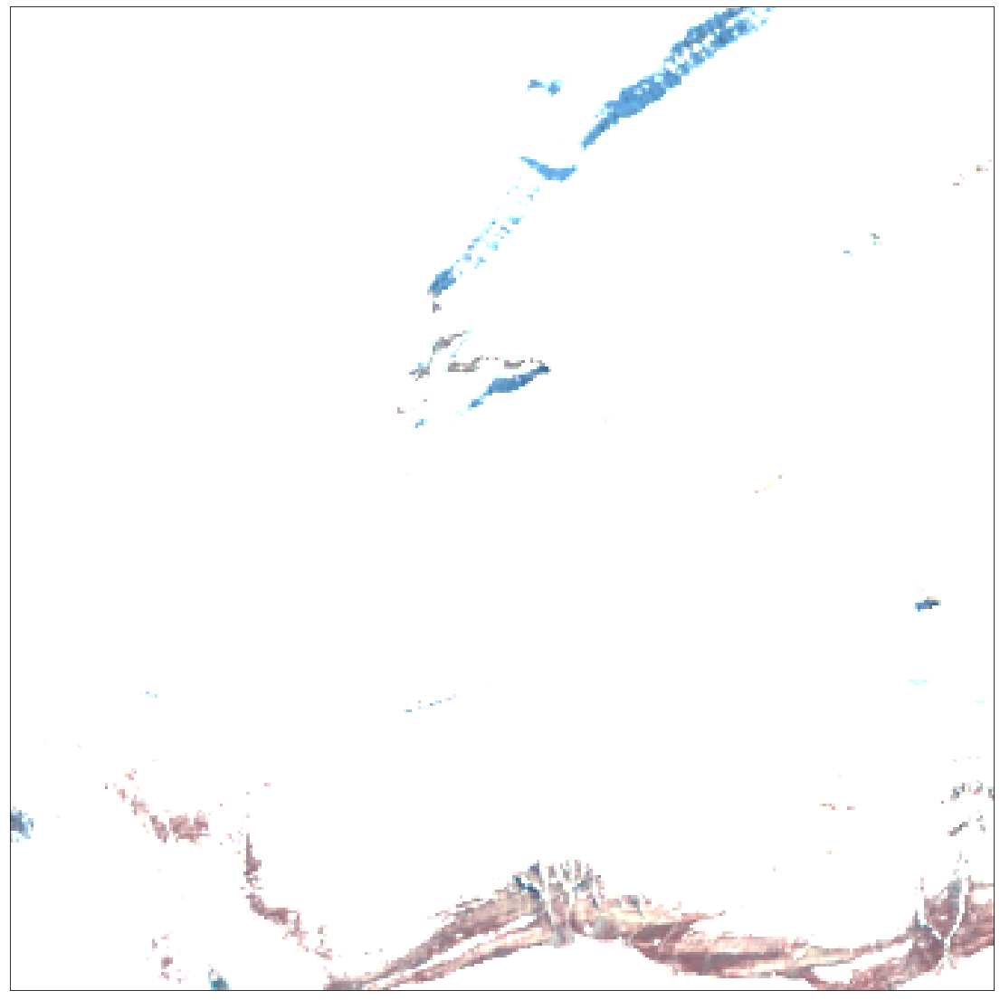

In [306]:
plot_utils.plot_RGB_LANDSAT_8_image(exemplary_eopatch, datetime_idx=0)

2013-05-25 15:26:35


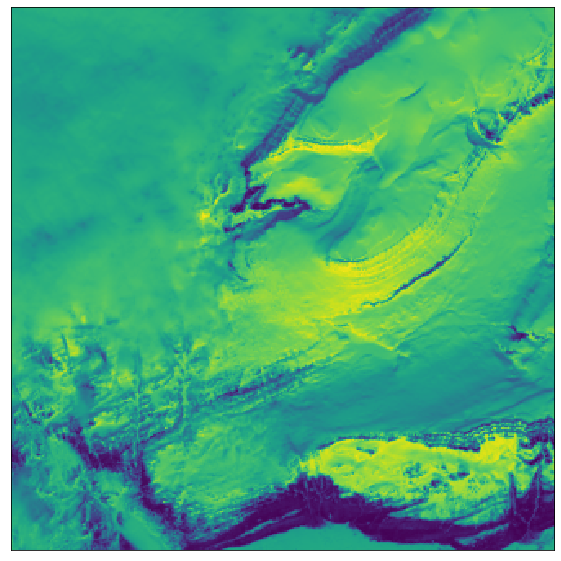

In [307]:
plot_utils.plot_single_band_LANDSAT_8(exemplary_eopatch, band_idx=0, data_acces_name='LANDSAT_RAW_BANDS',datetime_idx =0)

2014-05-28 15:24:05


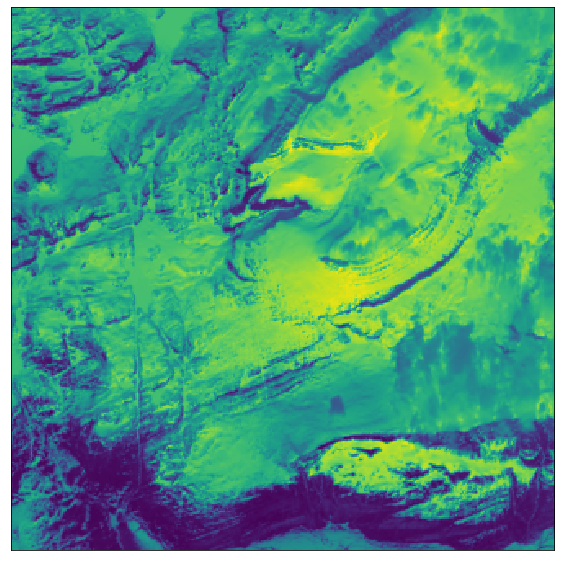

In [245]:
plot_utils.plot_single_band_LANDSAT_8(exemplary_eopatch, band_idx=1, data_acces_name='LANDSAT_RAW_BANDS',datetime_idx =1)

2014-05-28 15:24:05


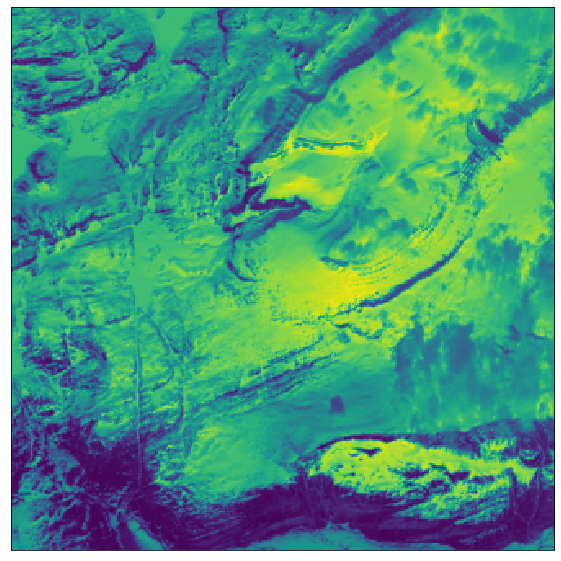

In [246]:
plot_utils.plot_single_band_LANDSAT_8(exemplary_eopatch, band_idx=2, data_acces_name='LANDSAT_RAW_BANDS',datetime_idx =1)

2014-05-28 15:24:05


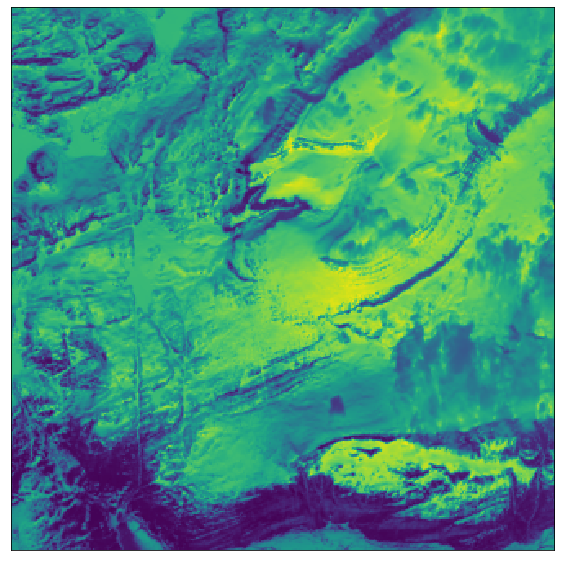

In [247]:
plot_utils.plot_single_band_LANDSAT_8(exemplary_eopatch, band_idx=3, data_acces_name='LANDSAT_RAW_BANDS',datetime_idx =1)

2014-05-28 15:24:05


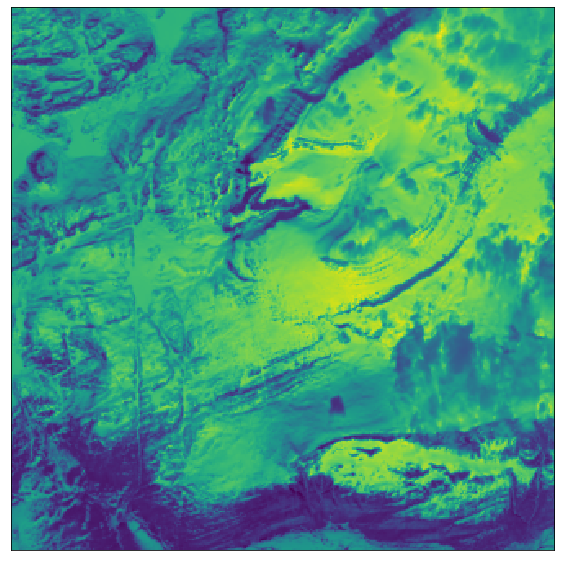

In [248]:
plot_utils.plot_single_band_LANDSAT_8(exemplary_eopatch, band_idx=4, data_acces_name='LANDSAT_RAW_BANDS',datetime_idx =1)

2013-05-25 15:26:35


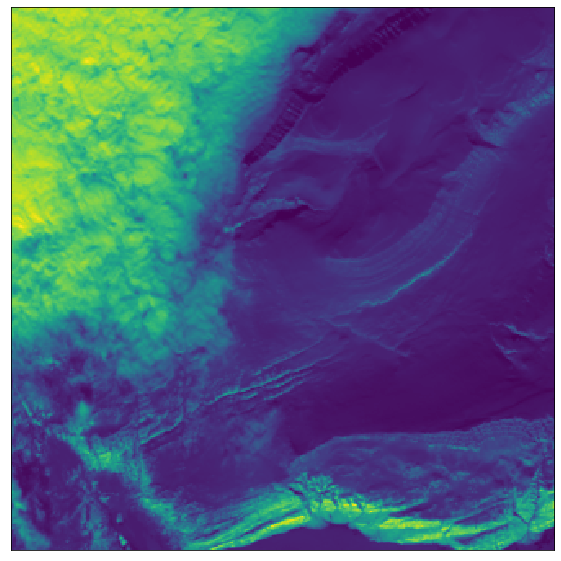

In [308]:
plot_utils.plot_single_band_LANDSAT_8(exemplary_eopatch, band_idx=5, data_acces_name='LANDSAT_RAW_BANDS',datetime_idx =0)

2013-05-25 15:26:35


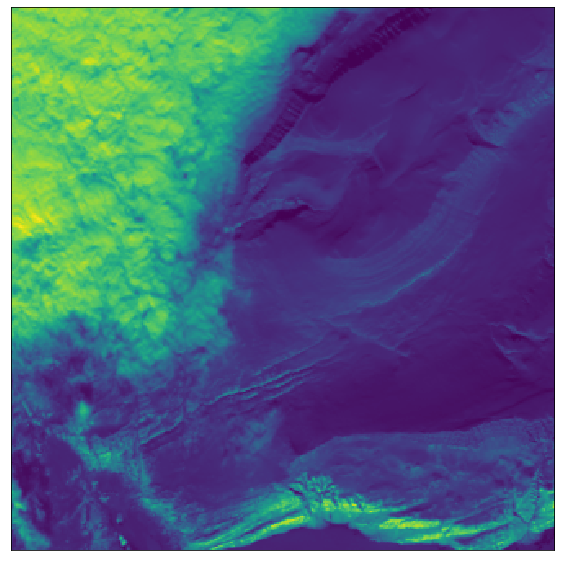

In [317]:
plot_utils.plot_single_band_LANDSAT_8(exemplary_eopatch, band_idx=6, data_acces_name='LANDSAT_RAW_BANDS',datetime_idx =0)

In [357]:
swir= exemplary_eopatch.data['LANDSAT_RAW_BANDS'][..., 5]
import numpy.ma as ma
mask = ma.masked_where(0.200 <= swir , swir)

([], <a list of 0 Text yticklabel objects>)

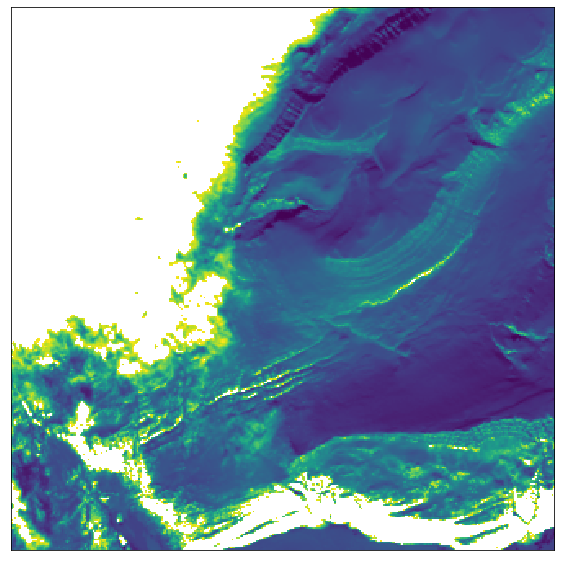

In [358]:
fig = plt.figure(figsize=(10, 10)) 
plt.imshow(mask[0].squeeze())
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

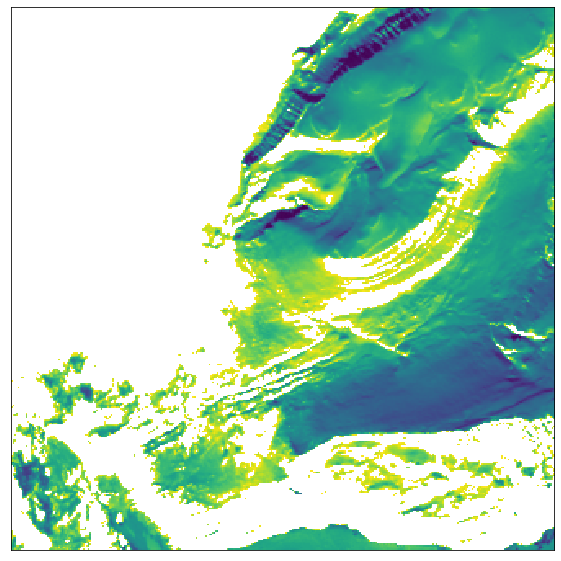

In [356]:
fig = plt.figure(figsize=(10, 10)) 
plt.imshow(mask[0].squeeze())
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

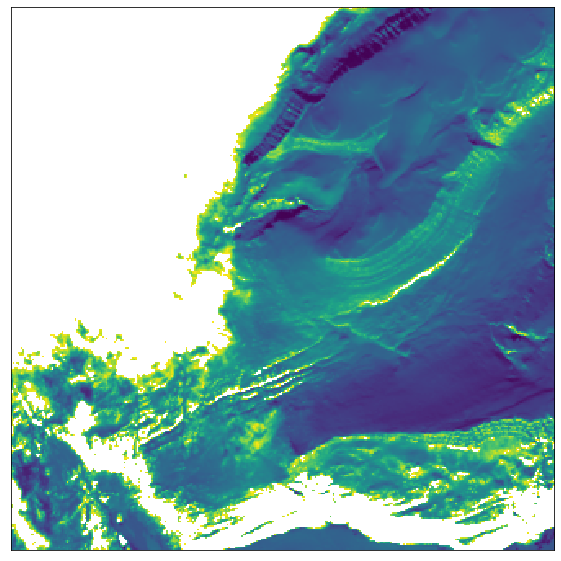

In [352]:
fig = plt.figure(figsize=(10, 10)) 
plt.imshow(mask[0].squeeze())
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

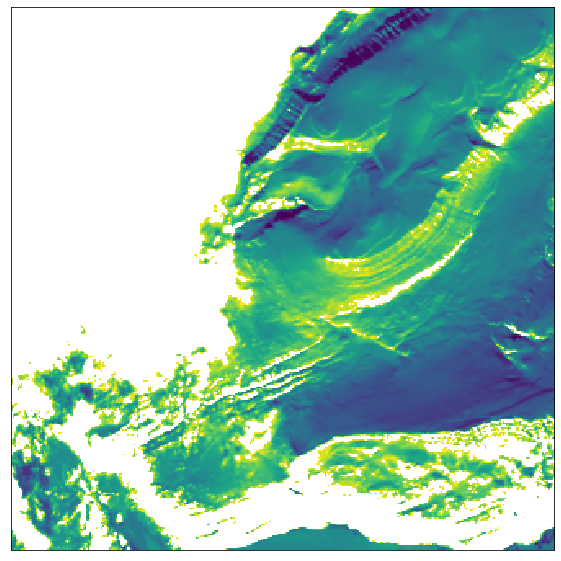

In [348]:
fig = plt.figure(figsize=(10, 10)) 
plt.imshow(mask[0].squeeze())
plt.xticks([])
plt.yticks([])

2014-05-28 15:24:05


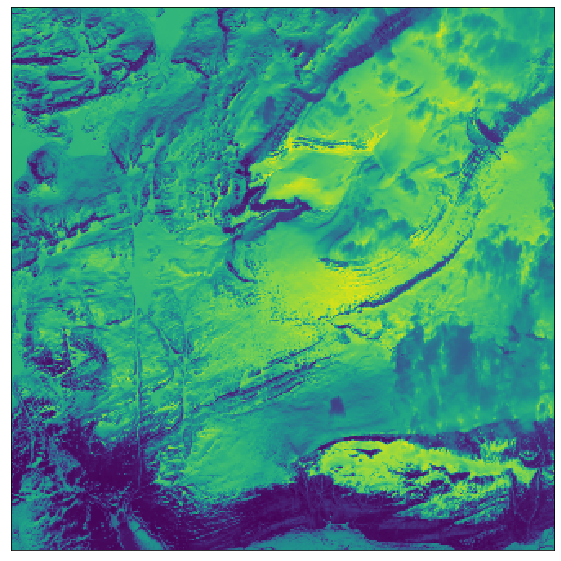

In [253]:
plot_utils.plot_single_band_LANDSAT_8(exemplary_eopatch, band_idx=7, data_acces_name='LANDSAT_RAW_BANDS',datetime_idx =1)

2014-05-28 15:24:05


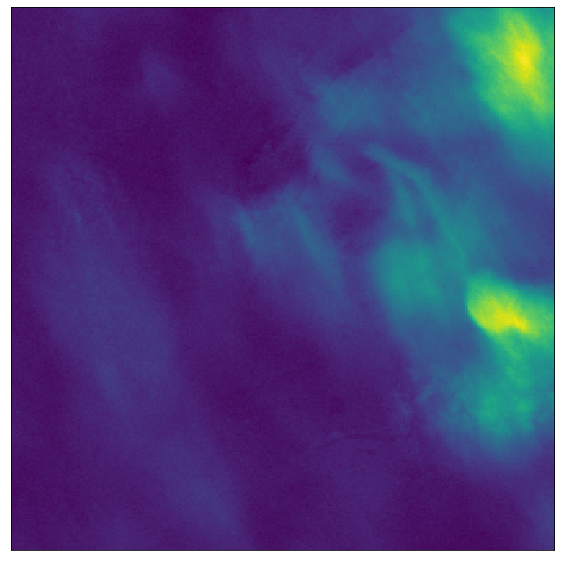

In [254]:
plot_utils.plot_single_band_LANDSAT_8(exemplary_eopatch, band_idx=8, data_acces_name='LANDSAT_RAW_BANDS',datetime_idx =1)

2014-05-28 15:24:05


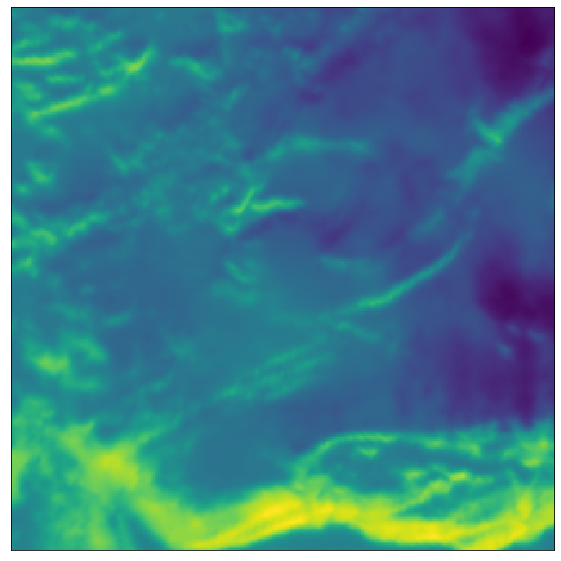

In [255]:
plot_utils.plot_single_band_LANDSAT_8(exemplary_eopatch, band_idx=9, data_acces_name='LANDSAT_RAW_BANDS',datetime_idx =1)

2014-05-28 15:24:05


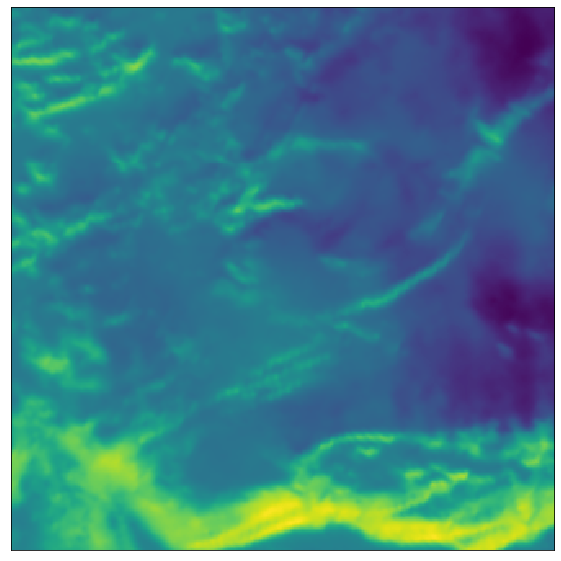

In [256]:
plot_utils.plot_single_band_LANDSAT_8(exemplary_eopatch, band_idx=10, data_acces_name='LANDSAT_RAW_BANDS',datetime_idx =1)

2014-05-28 15:24:05


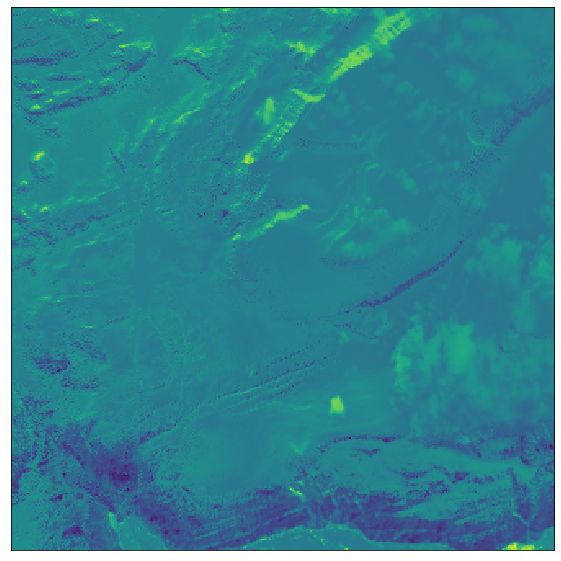

In [257]:
plot_utils.plot_single_band_LANDSAT_8(exemplary_eopatch, band_idx=0, data_acces_name='LANDSAT_NDWI' , datetime_idx =1 )

2014-05-28 15:24:05


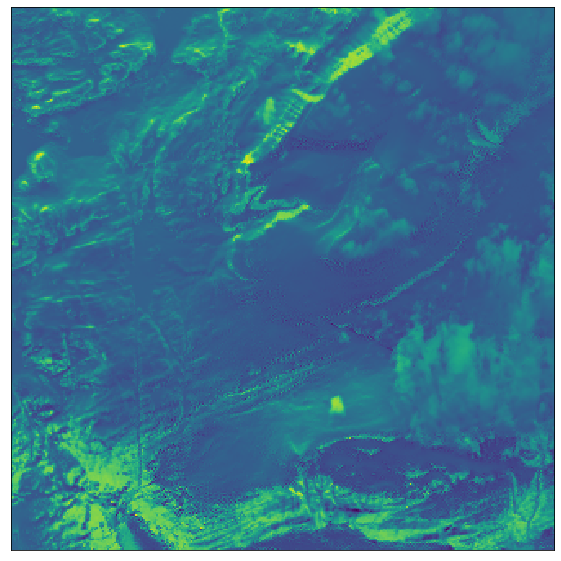

In [258]:
plot_utils.plot_single_band_LANDSAT_8(exemplary_eopatch, band_idx=0, data_acces_name='LANDSAT_NDWI_ICE' , datetime_idx =1 )

2014-07-03 00:00:54


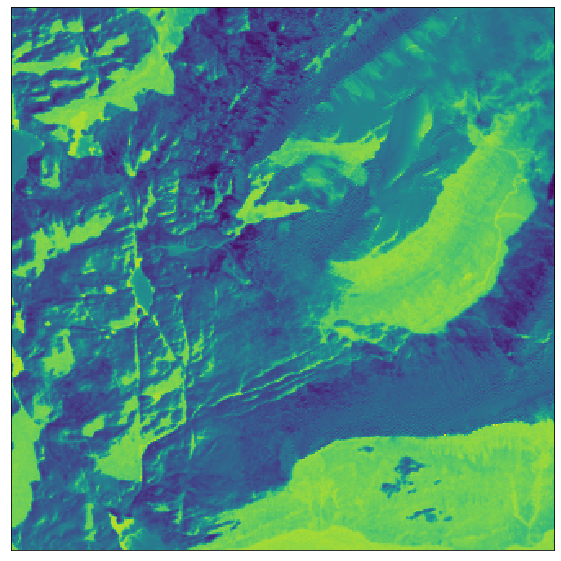

In [74]:
plot_utils.plot_single_band_LANDSAT_8(exemplary_eopatch, band_idx=0, data_acces_name='LANDSAT_NDWI_GREEN_NIR' , datetime_idx =3 )

2014-07-03 00:00:54


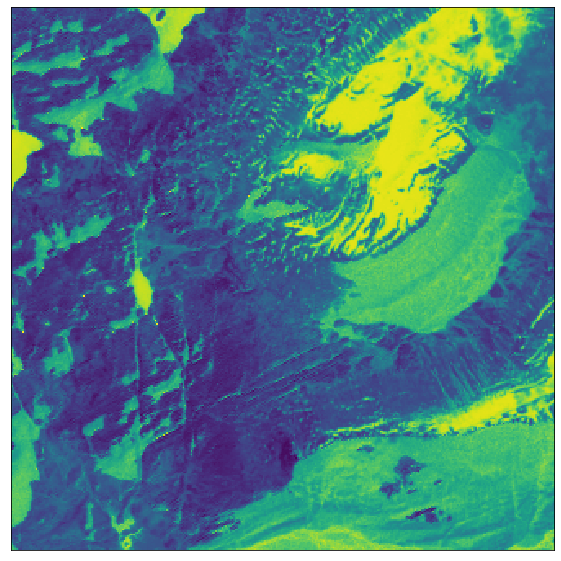

In [75]:
plot_utils.plot_single_band_LANDSAT_8(exemplary_eopatch, band_idx=0, data_acces_name='LANDSAT_NDWI_NIR_SWIR_1' , datetime_idx =3 )

2014-07-03 00:00:54


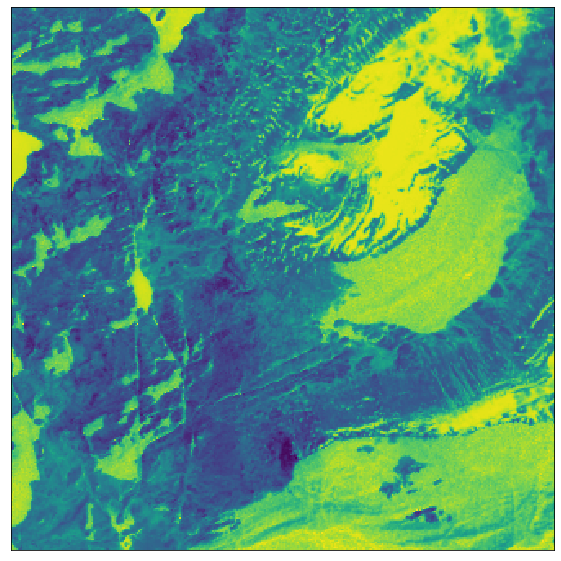

In [76]:
plot_utils.plot_single_band_LANDSAT_8(exemplary_eopatch, band_idx=0, data_acces_name='LANDSAT_NDWI_NIR_SWIR_2' , datetime_idx =3 )